<center> <img src = https://raw.githubusercontent.com/AndreyRysistov/DatasetsForPandas/main/hh%20label.jpg alt="drawing" style="width:400px;">

# <center> Проект: Анализ резюме из HeadHunter
   

In [3]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px

# Исследование структуры данных

1. Прочитайте данные с помощью библиотеки Pandas. Совет: перед чтением обратите внимание на разделитель внутри файла. 

In [6]:
hh_database_df = pd.read_csv(r"C:\Users\User\Desktop\MIFI HW4\dst-3.0_16_1_hh_database.csv", sep=';')

2. Выведите несколько первых (последних) строк таблицы, чтобы убедиться в том, что ваши данные не повреждены. Ознакомьтесь с признаками и их структурой.

In [8]:
print(hh_database_df.head(3))
print(hh_database_df.tail(3))

                                   Пол, возраст          ЗП  \
0    Мужчина ,  39 лет , родился 27 ноября 1979  29000 руб.   
1     Мужчина ,  60 лет , родился 20 марта 1959  40000 руб.   
2  Женщина ,  36 лет , родилась 12 августа 1982  20000 руб.   

  Ищет работу на должность:  \
0   Системный администратор   
1      Технический писатель   
2                  Оператор   

                        Город, переезд, командировки  \
0  Советск (Калининградская область) , не готов к...   
1  Королев , не готов к переезду , готов к редким...   
2  Тверь , не готова к переезду , не готова к ком...   

                                           Занятость  \
0  частичная занятость, проектная работа, полная ...   
1  частичная занятость, проектная работа, полная ...   
2                                   полная занятость   

                                              График  \
0  гибкий график, полный день, сменный график, ва...   
1  гибкий график, полный день, сменный график, уд...   
2   

3. Выведите основную информацию о числе непустых значений в столбцах и их типах в таблице.

In [10]:
print(hh_database_df.info())


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 44744 entries, 0 to 44743
Data columns (total 12 columns):
 #   Column                           Non-Null Count  Dtype 
---  ------                           --------------  ----- 
 0   Пол, возраст                     44744 non-null  object
 1   ЗП                               44744 non-null  object
 2   Ищет работу на должность:        44744 non-null  object
 3   Город, переезд, командировки     44744 non-null  object
 4   Занятость                        44744 non-null  object
 5   График                           44744 non-null  object
 6   Опыт работы                      44576 non-null  object
 7   Последнее/нынешнее место работы  44743 non-null  object
 8   Последняя/нынешняя должность     44742 non-null  object
 9   Образование и ВУЗ                44744 non-null  object
 10  Обновление резюме                44744 non-null  object
 11  Авто                             44744 non-null  object
dtypes: object(12)
memory usage: 4.1+

4. Обратите внимание на информацию о числе непустых значений.

In [12]:
print(hh_database_df.count())

Пол, возраст                       44744
ЗП                                 44744
Ищет работу на должность:          44744
Город, переезд, командировки       44744
Занятость                          44744
График                             44744
Опыт работы                        44576
Последнее/нынешнее место работы    44743
Последняя/нынешняя должность       44742
Образование и ВУЗ                  44744
Обновление резюме                  44744
Авто                               44744
dtype: int64


5. Выведите основную статистическую информацию о столбцах.


In [14]:
print(hh_database_df.describe(include='all'))

                                         Пол, возраст          ЗП  \
count                                           44744       44744   
unique                                          16003         690   
top     Мужчина ,  32 года , родился 17 сентября 1986  50000 руб.   
freq                                               18        4064   

       Ищет работу на должность:  \
count                      44744   
unique                     14929   
top      Системный администратор   
freq                        3099   

                             Город, переезд, командировки         Занятость  \
count                                               44744             44744   
unique                                              10063                38   
top     Москва , не готов к переезду , не готов к кома...  полная занятость   
freq                                                 1261             30026   

             График                                        Опыт работы  \
cou

# Преобразование данных

1. Начнем с простого - с признака **"Образование и ВУЗ"**. Его текущий формат это: **<Уровень образования год выпуска ВУЗ специальность...>**. Например:
* Высшее образование 2016 Московский авиационный институт (национальный исследовательский университет)...
* Неоконченное высшее образование 2000  Балтийская государственная академия рыбопромыслового флота…
Нас будет интересовать только уровень образования.

Создайте с помощью функции-преобразования новый признак **"Образование"**, который должен иметь 4 категории: "высшее", "неоконченное высшее", "среднее специальное" и "среднее".

Выполните преобразование, ответьте на контрольные вопросы и удалите признак "Образование и ВУЗ".

Совет: обратите внимание на структуру текста в столбце **"Образование и ВУЗ"**. Гарантируется, что текущий уровень образования соискателя всегда находится в первых 2ух слов и начинается с заглавной буквы. Воспользуйтесь этим.

*Совет: проверяйте полученные категории, например, с помощью метода unique()*


In [17]:
def obrazovanie(peremennaya):
    words = peremennaya.split()
    first_two_words = " ".join(words[:2])
    if "Высшее" in first_two_words:
        return "высшее"
    elif "Неоконченное высшее" in first_two_words:
        return "неоконченное высшее"
    elif "Среднее специальное" in first_two_words:
        return "среднее специальное"
    elif "Среднее образование" in first_two_words:
        return "среднее"
    else:
        return None  # Если вдруг текст не соответствует ни одному шаблону

# Создание признака Образование
hh_database_df['Образование'] = hh_database_df['Образование и ВУЗ'].apply(obrazovanie)

# Проверка уникальных значений нового признака
print(hh_database_df['Образование'].unique())

# Учитывая что в задаче, скорре всего, часто будет требоваться найти процент по критерию и среднее значение
# Создадим функции для этого

def summa_i_procent_crit(base, crit):
    vsego_strok = base.shape[0]
    crit_counts = base[crit].value_counts()
    # Создание DataFrame для таблицы суммы и процента по критерию
    crit_summary = pd.DataFrame({'Количество': crit_counts,'Процент': ((crit_counts / vsego_strok) * 100).round(2)})
    print(f"Значение и процент критериев по столбцу '{crit}'\n")
    print(f"{crit_summary}\n\n")

summa_i_procent_crit(hh_database_df, 'Образование')


['неоконченное высшее' 'высшее' 'среднее специальное' 'среднее']
Значение и процент критериев по столбцу 'Образование'

                     Количество  Процент
Образование                             
высшее                    33863    75.68
среднее специальное        5765    12.88
неоконченное высшее        4557    10.18
среднее                     559     1.25




In [18]:
# Удаление старого признака "Образование и ВУЗ"
hh_database_df.drop(columns=['Образование и ВУЗ'], inplace=True)

# Проверка результатов - три строки достаточно
print(hh_database_df.head(3))

                                   Пол, возраст          ЗП  \
0    Мужчина ,  39 лет , родился 27 ноября 1979  29000 руб.   
1     Мужчина ,  60 лет , родился 20 марта 1959  40000 руб.   
2  Женщина ,  36 лет , родилась 12 августа 1982  20000 руб.   

  Ищет работу на должность:  \
0   Системный администратор   
1      Технический писатель   
2                  Оператор   

                        Город, переезд, командировки  \
0  Советск (Калининградская область) , не готов к...   
1  Королев , не готов к переезду , готов к редким...   
2  Тверь , не готова к переезду , не готова к ком...   

                                           Занятость  \
0  частичная занятость, проектная работа, полная ...   
1  частичная занятость, проектная работа, полная ...   
2                                   полная занятость   

                                              График  \
0  гибкий график, полный день, сменный график, ва...   
1  гибкий график, полный день, сменный график, уд...   
2   

2. Теперь нас интересует столбец **"Пол, возраст"**. Сейчас он представлен в формате **<Пол , возраст , дата рождения >**. Например:
* Мужчина , 39 лет , родился 27 ноября 1979 
* Женщина , 21 год , родилась 13 января 2000
Как вы понимаете, нам необходимо выделить каждый параметр в отдельный столбец.

Создайте два новых признака **"Пол"** и **"Возраст"**. При этом важно учесть:
* Признак пола должен иметь 2 уникальных строковых значения: 'М' - мужчина, 'Ж' - женщина. 
* Признак возраста должен быть представлен целыми числами.

Выполните преобразование, ответьте на контрольные вопросы и удалите признак **"Пол, возраст"** из таблицы.

*Совет: обратите внимание на структуру текста в столбце, в части на то, как разделены параметры пола, возраста и даты рождения между собой - символом ' , '. 
Гарантируется, что структура одинакова для всех строк в таблице. Вы можете воспользоваться этим.*


In [21]:
# Создем три столбца: "Пол", "Возраст" из столбца "Пол, возраст"
hh_database_df[['Пол', 'Возраст']] = hh_database_df['Пол, возраст'].str.split(' , ', expand=True)[[0, 1]]

# Преобразуем признак "Пол" в М\Ж
hh_database_df['Пол'] = hh_database_df['Пол'].apply(lambda x: 'М' if x == 'Мужчина' else 'Ж')

# Извлекаем число (первый элемент) из признака "Возраст" и преобразуем в целое число
hh_database_df['Возраст'] = hh_database_df['Возраст'].str.split().str[0].astype(int)

# Создадим функцю для среднего
def srednee_crit(crit):
    srednee = hh_database_df[crit].apply(lambda x: x if isinstance(x, (int, float)) else None).mean()
    # Проверка на наличие NaN (если все значения нечисловые)
    if pd.isna(srednee):
        print("Не число, невозможно вычислить среднее")
    else:
        print(f"Среднее значение по столбцу '{crit}': {round(srednee, 2)}\n\n")

# Вычисления по заданию
summa_i_procent_crit(hh_database_df, 'Пол')
srednee_crit('Возраст')

Значение и процент критериев по столбцу 'Пол'

     Количество  Процент
Пол                     
М         36211    80.93
Ж          8533    19.07


Среднее значение по столбцу 'Возраст': 32.2




In [22]:
# Удаление старого столбца "Пол, возраст"
hh_database_df.drop(columns=['Пол, возраст'], inplace=True)

# Проверка результата
print(hh_database_df[['Пол', 'Возраст']].head(3))

  Пол  Возраст
0   М       39
1   М       60
2   Ж       36


3. Следующим этапом преобразуем признак **"Опыт работы"**. Его текущий формат - это: **<Опыт работы: n лет m месяцев, периоды работы в различных компаниях…>**. 

Из столбца нам необходимо выделить общий опыт работы соискателя в месяцах, новый признак назовем "Опыт работы (месяц)"

Для начала обсудим условия решения задачи:
* Во-первых, в данном признаке есть пропуски. Условимся, что если мы встречаем пропуск, оставляем его как есть (функция-преобразование возвращает NaN)
* Во-вторых, в данном признаке есть скрытые пропуски. Для некоторых соискателей в столбце стоит значения "Не указано". Их тоже обозначим как NaN (функция-преобразование возвращает NaN)
* В-третьих, нас не интересует информация, которая описывается после указания опыта работы (периоды работы в различных компаниях)
* В-четвертых, у нас есть проблема: опыт работы может быть представлен только в годах или только месяцах. Например, можно встретить следующие варианты:
    * Опыт работы 3 года 2 месяца…
    * Опыт работы 4 года…
    * Опыт работы 11 месяцев…
    * Учитывайте эту особенность в вашем коде

Учитывайте эту особенность в вашем коде

В результате преобразования у вас должен получиться столбец, содержащий информацию о том, сколько месяцев проработал соискатель.
Выполните преобразование, ответьте на контрольные вопросы и удалите столбец **"Опыт работы"** из таблицы.


In [24]:
# Функция для преобразования опыта работы из годомесяцев в месяцы
def opit_v_mesyacah(experience):
    if pd.isna(experience) or experience == "Не указано":
        return np.NaN
    experience = experience.split('  ')[0]
    months = 0 
    words = experience.split()
    # Обрабатываем слова и считаем количество месяцев опыта работы
    for i in range(len(words)):
        if words[i] in ['год', 'года', 'лет']:
            if i > 0 and words[i - 1].isdigit():
                months += int(words[i - 1]) * 12 
        elif words[i] in ['месяц', 'месяцев', 'месяца']:
            if i > 0 and words[i - 1].isdigit():
                months += int(words[i - 1])
    return months
 
# Создаем новый столбец (признак)
hh_database_df['Опыт работы (месяц)'] = hh_database_df['Опыт работы'].apply(opit_v_mesyacah)

# Создаем функцию для вычисления медианы по столбцу
def madiana_crit(base, crit):
    # Фильтруем только числовые значения
    numeric_values = base[crit].apply(pd.to_numeric, errors='coerce')
        # Вычисляем медиану 
    madiana = numeric_values.median()
     # Проверяем на NaN 
    if pd.isna(madiana):
        print("Не число, невозможно вычислить медиану, хотя кого это волнует...")
    else:
        print(f"Медиана по столбцу '{crit}': {madiana}\n\n")

# Вычисления по заданию
madiana_crit(hh_database_df, 'Опыт работы (месяц)')
hh_database_df['Опыт работы (месяц)'].describe()

Медиана по столбцу 'Опыт работы (месяц)': 100.0




count    44574.000000
mean       114.418944
std         79.047861
min          1.000000
25%         57.000000
50%        100.000000
75%        154.000000
max       1188.000000
Name: Опыт работы (месяц), dtype: float64

In [25]:
# Удаляем старый столбец
hh_database_df.drop(columns=['Опыт работы'], inplace=True)

# Проверка результата, как всегда три строки
print(hh_database_df.head(3))

           ЗП Ищет работу на должность:  \
0  29000 руб.   Системный администратор   
1  40000 руб.      Технический писатель   
2  20000 руб.                  Оператор   

                        Город, переезд, командировки  \
0  Советск (Калининградская область) , не готов к...   
1  Королев , не готов к переезду , готов к редким...   
2  Тверь , не готова к переезду , не готова к ком...   

                                           Занятость  \
0  частичная занятость, проектная работа, полная ...   
1  частичная занятость, проектная работа, полная ...   
2                                   полная занятость   

                                              График  \
0  гибкий график, полный день, сменный график, ва...   
1  гибкий график, полный день, сменный график, уд...   
2                                        полный день   

  Последнее/нынешнее место работы  \
0         МАОУ "СОШ № 1 г.Немана"   
1    Временный трудовой коллектив   
2                    ПАО Сбербанк   

   

4. Хорошо идем! Следующий на очереди признак "Город, переезд, командировки". Информация в нем представлена в следующем виде: **<Город , (метро) , готовность к переезду (города для переезда) , готовность к командировкам>**. В скобках указаны необязательные параметры строки. Например, можно встретить следующие варианты:

* Москва , не готов к переезду , готов к командировкам
* Москва , м. Беломорская , не готов к переезду, не готов к командировкам
* Воронеж , готов к переезду (Сочи, Москва, Санкт-Петербург) , готов к командировкам

Создадим отдельные признаки **"Город"**, **"Готовность к переезду"**, **"Готовность к командировкам"**. При этом важно учесть:

* Признак **"Город"** должен содержать только 4 категории: "Москва", "Санкт-Петербург" и "город-миллионник" (их список ниже), остальные обозначьте как "другие".

    Список городов-миллионников:
    
   <code>million_cities = ['Новосибирск', 'Екатеринбург','Нижний Новгород','Казань', 'Челябинск','Омск', 'Самара', 'Ростов-на-Дону', 'Уфа', 'Красноярск', 'Пермь', 'Воронеж','Волгоград']
    </code>
    Инфорация о метро, рядом с которым проживает соискатель нас не интересует.
* Признак **"Готовность к переезду"** должен иметь два возможных варианта: True или False. Обратите внимание, что возможны несколько вариантов описания готовности к переезду в признаке "Город, переезд, командировки". Например:
    * … , готов к переезду , …
    * … , не готова к переезду , …
    * … , готова к переезду (Москва, Санкт-Петербург, Ростов-на-Дону)
    * … , хочу переехать (США) , …
    
    Нас интересует только сам факт возможности или желания переезда.
* Признак **"Готовность к командировкам"** должен иметь два возможных варианта: True или False. Обратите внимание, что возможны несколько вариантов описания готовности к командировкам в признаке "Город, переезд, командировки". Например:
    * … , готов к командировкам , … 
    * … , готова к редким командировкам , …
    * … , не готов к командировкам , …
    
    Нас интересует только сам факт готовности к командировке.
    
    Еще один важный факт: при выгрузки данных у некоторых соискателей "потерялась" информация о готовности к командировкам. Давайте по умолчанию будем считать, что такие соискатели не готовы к командировкам.
    
Выполните преобразования и удалите столбец **"Город, переезд, командировки"** из таблицы.

*Совет: обратите внимание на то, что структура текста может меняться в зависимости от указания ближайшего метро. Учите это, если будете использовать порядок слов в своей программе.*


In [27]:
# Список городов-миллионников
million_cities = ['Новосибирск', 'Екатерибург', 'Нижний Новгород', 'Казань', 
                  'Челябинск', 'Омск', 'Самара', 'Ростов-на-Дону', 'Уфа', 
                  'Красноярск', 'Пермь', 'Воронеж', 'Волгоград']

# Функция для категоризации городов
def russian_city(location_info):
    # Разделяем строку по запятой
    parts = location_info.split(',')
    city = parts[0].strip()  # Первый элемент - это город
    
    if city == "Москва":
        return "Москва"
    elif city == "Санкт-Петербург":
        return "Санкт-Петербург"
    elif city in million_cities:
        return "город-миллионник"
    else:
        return "другие"

def gotov_k_pereezdu(location_info):
    # Разделяем строку на элементы 
    elements = location_info.split(',')
 # Ищем элемент, содержащий "перее"
    for element in elements:
        if "перее" in element:
            # Убираем лишние пробелы
            first_part = element.strip().split()[0]  # Получаем первый элемент после разделения 
            if first_part == "не" or first_part == "Не":
                return False
            else:
                return True
    return False  # Если не нашли элемент с "перее", значит соискатель ничего про это не указал

def gotov_k_komandirovke(location_info):
    # Разделяем строку на элементы 
    elements = location_info.split(',')
 # Ищем элемент, содержащий "командиро"
    for element in elements:
        if "командиро" in element:
            # Убираем лишние пробелы
            first_part = element.strip().split()[0]  # Получаем первый элемент после разделения 
            if first_part == "не" or first_part == "Не":
                return False
            else:
                return True
    return False  # Если не нашли элемент с "командиро", значит соискатель ничего про это не указал


# Создание новых столбцов
hh_database_df['Город'] = hh_database_df['Город, переезд, командировки'].apply(russian_city)
hh_database_df['Готовность к переезду'] = hh_database_df['Город, переезд, командировки'].apply(gotov_k_pereezdu)
hh_database_df['Готовность к командировкам'] = hh_database_df['Город, переезд, командировки'].apply(gotov_k_komandirovke)

# ВПроверка
summa_i_procent_crit(hh_database_df, 'Город')
summa_i_procent_crit(hh_database_df, 'Готовность к переезду')
summa_i_procent_crit(hh_database_df, 'Готовность к командировкам')

def summa_criteriev (base, crit1, uslovie1, crit2, uslovie2):
    # Фильтр по готовности к переезду и командировкам
    summa_crit = base[(base[crit1] == uslovie1) & (base[crit2] == uslovie2)]
    print(f"Соискатели, для которых {crit1} - {uslovie1} и {crit2} - {uslovie2}:\n"
          f"Количество: {summa_crit.shape[0]} чел, это {round(summa_crit.shape[0] / base.shape[0] * 100, 2)}%")

# Вычисления по заданию
summa_criteriev(hh_database_df, 'Готовность к переезду', True, 'Готовность к командировкам', True)

Значение и процент критериев по столбцу 'Город'

                  Количество  Процент
Город                                
Москва                 16621    37.15
другие                 16588    37.07
город-миллионник        6598    14.75
Санкт-Петербург         4937    11.03


Значение и процент критериев по столбцу 'Готовность к переезду'

                       Количество  Процент
Готовность к переезду                     
False                       28719    64.19
True                        16025    35.81


Значение и процент критериев по столбцу 'Готовность к командировкам'

                            Количество  Процент
Готовность к командировкам                     
True                             31640    70.71
False                            13104    29.29


Соискатели, для которых Готовность к переезду - True и Готовность к командировкам - True:
Количество: 14258 чел, это 31.87%


In [28]:
# Удаление старого столбца
hh_database_df.drop(columns=['Город, переезд, командировки'], inplace=True)

# Проверка результата
print(hh_database_df.head(3))

           ЗП Ищет работу на должность:  \
0  29000 руб.   Системный администратор   
1  40000 руб.      Технический писатель   
2  20000 руб.                  Оператор   

                                           Занятость  \
0  частичная занятость, проектная работа, полная ...   
1  частичная занятость, проектная работа, полная ...   
2                                   полная занятость   

                                              График  \
0  гибкий график, полный день, сменный график, ва...   
1  гибкий график, полный день, сменный график, уд...   
2                                        полный день   

  Последнее/нынешнее место работы  \
0         МАОУ "СОШ № 1 г.Немана"   
1    Временный трудовой коллектив   
2                    ПАО Сбербанк   

                       Последняя/нынешняя должность Обновление резюме  \
0                           Системный администратор  16.04.2019 15:59   
1  Менеджер проекта, Аналитик, Технический писатель  12.04.2019 08:42   
2        

5. Рассмотрим поближе признаки **"Занятость"** и **"График"**. Сейчас признаки представляют собой набор категорий желаемой занятости (полная занятость, частичная занятость, проектная работа, волонтерство, стажировка) и желаемого графика работы (полный день, сменный график, гибкий график, удаленная работа, вахтовый метод).
На сайте hh.ru соискатель может указывать различные комбинации данных категорий, например:
* полная занятость, частичная занятость
* частичная занятость, проектная работа, волонтерство
* полный день, удаленная работа
* вахтовый метод, гибкий график, удаленная работа, полная занятость

Такой вариант признаков имеет множество различных комбинаций, а значит множество уникальных значений, что мешает анализу. Нужно это исправить!

Давайте создадим признаки-мигалки для каждой категории: если категория присутствует в списке желаемых соискателем, то в столбце на месте строки рассматриваемого соискателя ставится True, иначе - False.

Такой метод преобразования категориальных признаков называется One Hot Encoding и его схема представлена на рисунке ниже:
<img src=https://raw.githubusercontent.com/AndreyRysistov/DatasetsForPandas/main/ohe.jpg>
Выполните данное преобразование для признаков "Занятость" и "График", ответьте на контрольные вопросы, после чего удалите их из таблицы

In [30]:
# Создаем шаблоны категорй занятости и графика
cateroriya_zanyatosti = ['полная занятость', 'частичная занятость', 'проектная работа', 'волонтерство', 'стажировка']
cateroriya_grafika = ['полный день', 'сменный график', 'гибкий график', 'удаленная работа', 'вахтовый метод']

# Разделяем строки на отдельные категории и создаем столбцы - мигалки по занятости
for category in cateroriya_zanyatosti:
    hh_database_df[category] = hh_database_df['Занятость'].apply(lambda x: category in x)

# Разделяем строки на отдельные категории и создаем столбцы - мигалки по графику
for category in cateroriya_grafika:
    hh_database_df[category] = hh_database_df['График'].apply(lambda x: category in x)

# Вычисления по заданию
summa_criteriev(hh_database_df, 'проектная работа', True, 'волонтерство', True)
summa_criteriev(hh_database_df, 'вахтовый метод', True, 'гибкий график', True)

Соискатели, для которых проектная работа - True и волонтерство - True:
Количество: 436 чел, это 0.97%
Соискатели, для которых вахтовый метод - True и гибкий график - True:
Количество: 2311 чел, это 5.16%


In [31]:
# Удаляем исходные столбцы "Занятость" и "График"
hh_database_df.drop(columns=['Занятость', 'График'], inplace=True)

# Проверка
print(hh_database_df.head(1))

           ЗП Ищет работу на должность: Последнее/нынешнее место работы  \
0  29000 руб.   Системный администратор         МАОУ "СОШ № 1 г.Немана"   

  Последняя/нынешняя должность Обновление резюме  \
0      Системный администратор  16.04.2019 15:59   

                             Авто          Образование Пол  Возраст  \
0  Имеется собственный автомобиль  неоконченное высшее   М       39   

   Опыт работы (месяц)  ... полная занятость  частичная занятость  \
0                202.0  ...             True                 True   

   проектная работа  волонтерство  стажировка  полный день  сменный график  \
0              True         False       False         True            True   

   гибкий график  удаленная работа  вахтовый метод  
0           True              True            True  

[1 rows x 23 columns]


6. (2 балла) Наконец, мы добрались до самого главного и самого важного - признака заработной платы **"ЗП"**. 
В чем наша беда? В том, что помимо желаемой заработной платы соискатель указывает валюту, в которой он бы хотел ее получать, например:
* 30000 руб.
* 50000 грн.
* 550 USD

Нам бы хотелось видеть заработную плату в единой валюте, например, в рублях. Возникает вопрос, а где взять курс валют по отношению к рублю?

На самом деле язык Python имеет в арсенале огромное количество возможностей получения данной информации, от обращения к API Центробанка, до использования специальных библиотек, например pycbrf. Однако, это не тема нашего проекта.

Поэтому мы пойдем в лоб: обратимся к специальным интернет-ресурсам для получения данных о курсе в виде текстовых файлов. Например, MDF.RU, данный ресурс позволяет удобно экспортировать данные о курсах различных валют и акций за указанные периоды в виде csv файлов. Мы уже сделали выгрузку курсов валют, которые встречаются в наших данных за период с 29.12.2017 по 05.12.2019. Скачать ее вы можете **на платформе**

Создайте новый DataFrame из полученного файла. В полученной таблице нас будут интересовать столбцы:
* "currency" - наименование валюты в ISO кодировке,
* "date" - дата, 
* "proportion" - пропорция, 
* "close" - цена закрытия (последний зафиксированный курс валюты на указанный день).


Перед вами таблица соответствия наименований иностранных валют в наших данных и их общепринятых сокращений, которые представлены в нашем файле с курсами валют. Пропорция - это число, за сколько единиц валюты указан курс в таблице с курсами. Например, для казахстанского тенге курс на 20.08.2019 составляет 17.197 руб. за 100 тенге, тогда итоговый курс равен - 17.197 / 100 = 0.17197 руб за 1 тенге.
Воспользуйтесь этой информацией в ваших преобразованиях.

<img src=https://raw.githubusercontent.com/AndreyRysistov/DatasetsForPandas/main/table.jpg>


Осталось только понять, откуда брать дату, по которой определяется курс? А вот же она - в признаке **"Обновление резюме"**, в нем содержится дата и время, когда соискатель выложил текущий вариант своего резюме. Нас интересует только дата, по ней бы и будем сопоставлять курсы валют.

Теперь у нас есть вся необходимая информация для того, чтобы создать признак "ЗП (руб)" - заработная плата в рублях.

После ответа на контрольные вопросы удалите исходный столбец заработной платы "ЗП" и все промежуточные столбцы, если вы их создавали.

Итак, давайте обсудим возможный алгоритм преобразования: 
1. Перевести признак "Обновление резюме" из таблицы с резюме в формат datetime и достать из него дату. В тот же формат привести признак "date" из таблицы с валютами.
2. Выделить из столбца "ЗП" сумму желаемой заработной платы и наименование валюты, в которой она исчисляется. Наименование валюты перевести в стандарт ISO согласно с таблицей выше.
3. Присоединить к таблице с резюме таблицу с курсами по столбцам с датой и названием валюты (подумайте, какой тип объединения надо выбрать, чтобы в таблице с резюме сохранились данные о заработной плате, изначально представленной в рублях). Значение close для рубля заполнить единицей 1 (курс рубля самого к себе)
4. Умножить сумму желаемой заработной платы на присоединенный курс валюты (close) и разделить на пропорцию (обратите внимание на пропуски после объединения в этих столбцах), результат занести в новый столбец "ЗП (руб)".


In [34]:
#Загрузка, проверка и подготовка данных по курсам валют
er_df = pd.read_csv(r"C:\Users\User\Desktop\MIFI HW4\ExchangeRates.csv", sep=',')

# Создаем новый датафрейм и добавлем в него столбцы
er_df = er_df[['currency', 'date', 'proportion', 'close']]

# Преобразуем даты в формат datetime
er_df['date'] = pd.to_datetime(er_df['date'], format='%d/%m/%y').dt.date

# Проверка 
print(er_df.info())
print(er_df.head(1))

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5664 entries, 0 to 5663
Data columns (total 4 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   currency    5664 non-null   object 
 1   date        5664 non-null   object 
 2   proportion  5664 non-null   int64  
 3   close       5664 non-null   float64
dtypes: float64(1), int64(1), object(2)
memory usage: 177.1+ KB
None
  currency        date  proportion    close
0      USD  2017-12-29           1  57.6291


In [35]:
# Преобразуем даты 'Обновление резюме' в формат datetime
hh_database_df['date_of_res'] = pd.to_datetime(hh_database_df['Обновление резюме'], dayfirst=True).dt.date

# Столбец "ЗП" имеет формат '30000 руб.', '50000 грн.', '550 USD'
# Создадим новые столбцы для хранения суммы и валюты, очищаем данные от пробелов, небукв и т.д.
hh_database_df[['ЖЗП', 'Валюта']] = hh_database_df['ЗП'].str.extract(r'(\d+)\s*([a-zA-Zа-яА-Я]+)')
hh_database_df['ЖЗП'] = hh_database_df['ЖЗП'].astype(float)  # Преобразуем в числовой формат

# Создаем датафрейм для соответствия наименований валют в основной столбце 'Валюта', их ISO кодов и пропорций
data = {
    'Название валюты': ['грн', 'USD', 'EUR', 'бел', 'KGS', 'сум', 'AZN', 'KZT', 'руб'],
    'Код ISO': ['UAH', 'USD', 'EUR', 'BYN', 'KGS', 'UZS', 'AZN', 'KZT', 'RUB'],
    'proportion': [10, 1, 1, 1, 10, 10000, 1, 100, 1]
    }
currency_df = pd.DataFrame(data)

# Меняем название валюты на ISO
hh_database_df['Валюта'] = hh_database_df['Валюта'].map(currency_df.set_index('Название валюты')['Код ISO'])

# Проверки
print(hh_database_df.info())
summa_i_procent_crit(hh_database_df, 'Валюта')
print(hh_database_df.head(3))

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 44744 entries, 0 to 44743
Data columns (total 26 columns):
 #   Column                           Non-Null Count  Dtype  
---  ------                           --------------  -----  
 0   ЗП                               44744 non-null  object 
 1   Ищет работу на должность:        44744 non-null  object 
 2   Последнее/нынешнее место работы  44743 non-null  object 
 3   Последняя/нынешняя должность     44742 non-null  object 
 4   Обновление резюме                44744 non-null  object 
 5   Авто                             44744 non-null  object 
 6   Образование                      44744 non-null  object 
 7   Пол                              44744 non-null  object 
 8   Возраст                          44744 non-null  int32  
 9   Опыт работы (месяц)              44574 non-null  float64
 10  Город                            44744 non-null  object 
 11  Готовность к переезду            44744 non-null  bool   
 12  Готовность к коман

In [36]:
# Объединеняем основной df с курсами по дате и валюте
hh_database_df = hh_database_df.merge(er_df, left_on=['date_of_res', 'Валюта'], right_on=['date', 'currency'], how='left')

# Заменяем значения в hh_database_df
hh_database_df['proportion'] = hh_database_df['Валюта'].map(currency_df.set_index('Код ISO')['proportion'])

# Устанавливаем курс рубля равным 1
hh_database_df.loc[hh_database_df['Валюта'] == 'RUB', 'close'] = 1

# Умножаем сумму желаемой заработной платы на курс валюты (на пропорцию не делим, сделали это в er_df)
hh_database_df['ЗП (руб)'] = (hh_database_df['ЖЗП'] * hh_database_df['close'])/hh_database_df['proportion']

# Удаляем ненужные столбцы
hh_database_df.drop(columns=['ЗП', 'ЖЗП', 'date_of_res', 'Валюта', 'currency', 'date', 'proportion', 'close'], inplace=True)

# Вычисления по заданию
madiana_crit(hh_database_df, 'ЗП (руб)')

# Проверка
print(hh_database_df.info())

Медиана по столбцу 'ЗП (руб)': 59019.0


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 44744 entries, 0 to 44743
Data columns (total 23 columns):
 #   Column                           Non-Null Count  Dtype  
---  ------                           --------------  -----  
 0   Ищет работу на должность:        44744 non-null  object 
 1   Последнее/нынешнее место работы  44743 non-null  object 
 2   Последняя/нынешняя должность     44742 non-null  object 
 3   Обновление резюме                44744 non-null  object 
 4   Авто                             44744 non-null  object 
 5   Образование                      44744 non-null  object 
 6   Пол                              44744 non-null  object 
 7   Возраст                          44744 non-null  int32  
 8   Опыт работы (месяц)              44574 non-null  float64
 9   Город                            44744 non-null  object 
 10  Готовность к переезду            44744 non-null  bool   
 11  Готовность к командировкам       44744 

# Исследование зависимостей в данных

1. Постройте распределение признака **"Возраст"**. Опишите распределение, отвечая на следующие вопросы: чему равна мода распределения, каковы предельные значения признака, в каком примерном интервале находится возраст большинства соискателей? Есть ли аномалии для признака возраста, какие значения вы бы причислили к их числу?
*Совет: постройте гистограмму и коробчатую диаграмму рядом.*

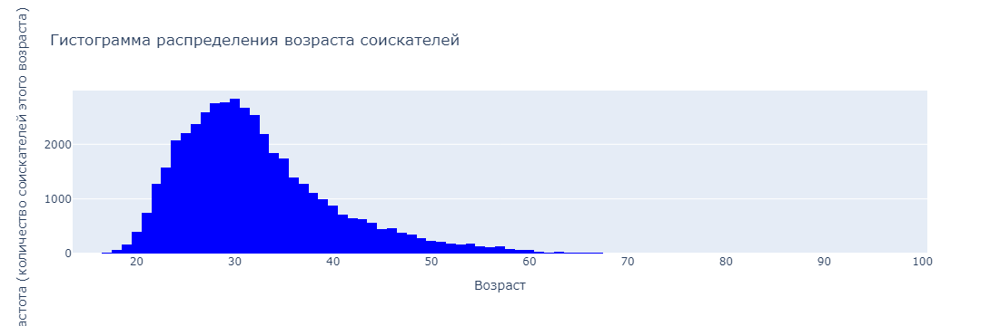

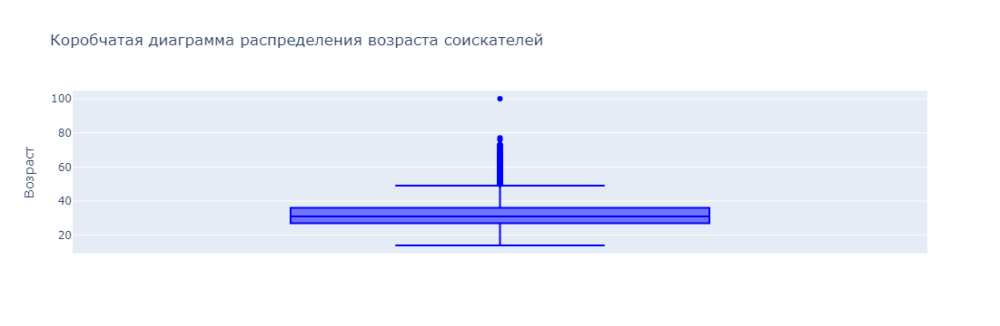

30


In [42]:

# Построение гистограммы
fig_hist = px.histogram(hh_database_df, x='Возраст', title='Гистограмма распределения возраста соискателей', color_discrete_sequence=['blue'])
fig_hist.update_layout(xaxis_title='Возраст', yaxis_title='Частота (количество соискателей этого возраста)')
fig_hist.show()
fig_hist.write_html("plotly/1_histogram_year.html")

# Построение коробчатой диаграммы
fig_box = px.box(hh_database_df, y='Возраст', title='Коробчатая диаграмма распределения возраста соискателей',
                 color_discrete_sequence=['blue'])
fig_box.update_layout(yaxis_title='Возраст')
fig_box.show()
fig_box.write_html("plotly/2_box_year.html")

print(hh_database_df['Возраст'].mode()[0])


Мода распределения - 30 лет, меиана распределения - 31 год.
Предельные значения признака - от 14 до 49 лет., возраст большинства соискателей находится в примерных границах от 27 до 36 лет (1 и 3 квартили)? 
Аномалии для признака возраста, в соответствии с корочатой диаграммой - от 50 лет, есть одно значение в 100 лет - явная ошибка.

2. Постройте распределение признака **"Опыт работы (месяц)"**. Опишите данное распределение, отвечая на следующие вопросы: чему равна мода распределения, каковы предельные значения признака, в каком примерном интервале находится опыт работы большинства соискателей? Есть ли аномалии для признака опыта работы, какие значения вы бы причислили к их числу?
*Совет: постройте гистограмму и коробчатую диаграмму рядом.*

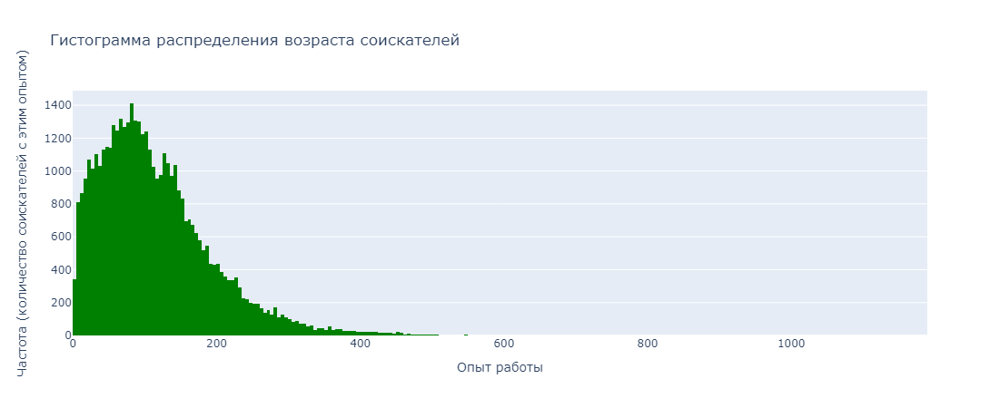

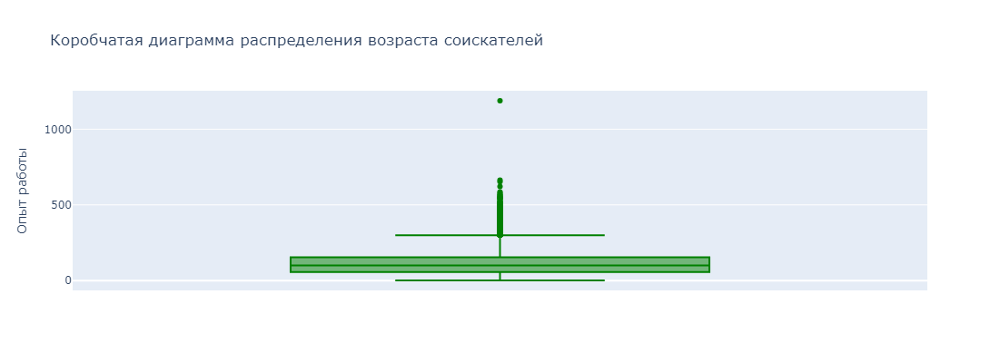

81.0


In [44]:
# Построение гистограммы
fig_hist = px.histogram(hh_database_df, 
                        x='Опыт работы (месяц)', 
                        title='Гистограмма распределения возраста соискателей', 
                        color_discrete_sequence=['green'],
                        height=450,
                        width=1200)
fig_hist.update_layout(xaxis_title='Опыт работы', yaxis_title='Частота (количество соискателей с этим опытом)')
fig_hist.show()
fig_hist.write_html("plotly/3_opit_mes.html")

# Построение коробчатой диаграммы
fig_box = px.box(hh_database_df, 
                 y='Опыт работы (месяц)', 
                 title='Коробчатая диаграмма распределения возраста соискателей',
                 color_discrete_sequence=['green'],
                 height=400,
                 width=1200)
fig_box.update_layout(yaxis_title='Опыт работы')
fig_box.show()
fig_box.write_html("plotly/4_opit_mes.html")

# Вычисления по заданию
print(hh_database_df['Опыт работы (месяц)'].mode()[0])

Мода распределения - 81 мес, медиана распределения - 100 мес (8 лет 4 мес)
Предельные значения признака - от 1 мес до 299 мес (24 года 11 мес), опыт большинства соискателей находится в примерных границах от 57 (4 года 9 мес)до 299 мес (1 и 3 квартили)? 
Аномалии для признака возраста - от 300 мес опыта, есть одно значение в 1188 мес - явная ошибка.

3. Постройте распределение признака **"ЗП (руб)"**. Опишите данное распределение, отвечая на следующие вопросы: каковы предельные значения признака, в каком примерном интервале находится заработная плата большинства соискателей? Есть ли аномалии для признака возраста? Обратите внимание на гигантские размеры желаемой заработной платы.
*Совет: постройте гистограмму и коробчатую диаграмму рядом.*


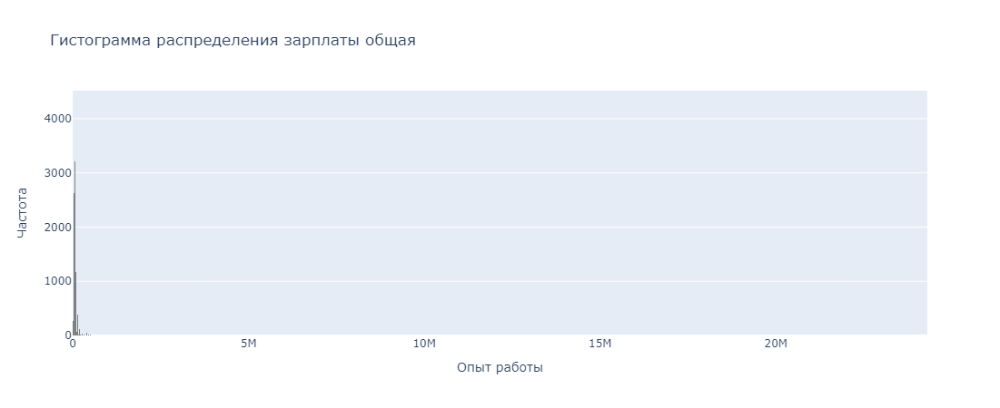

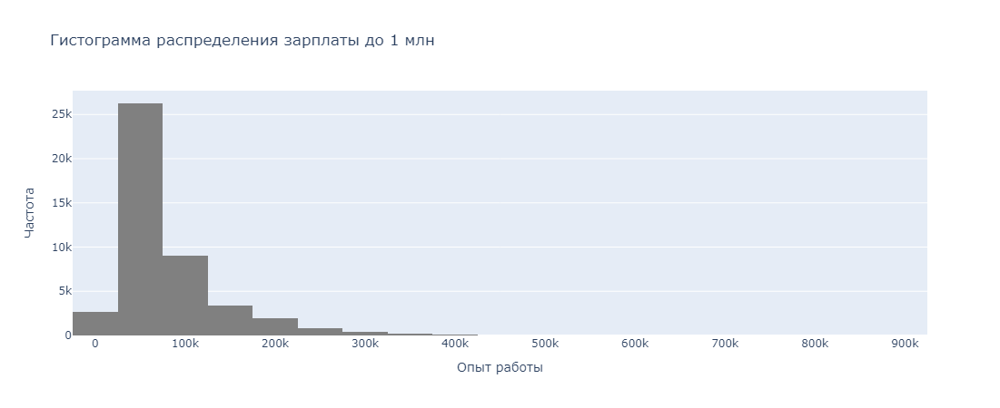

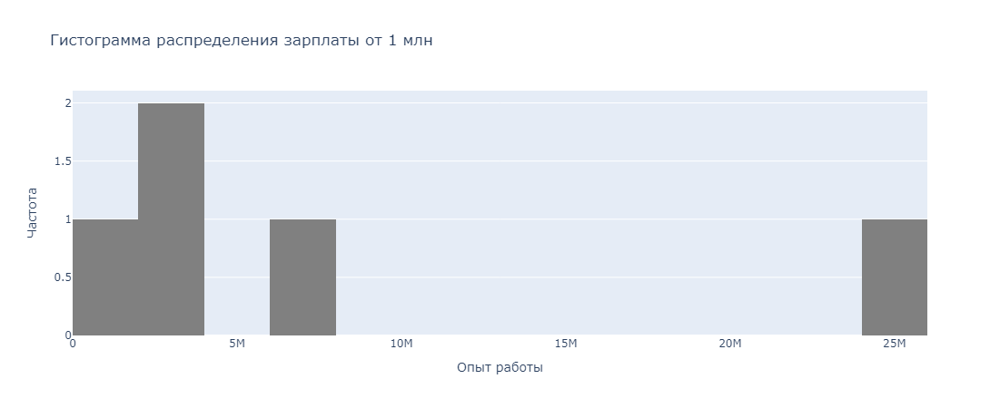

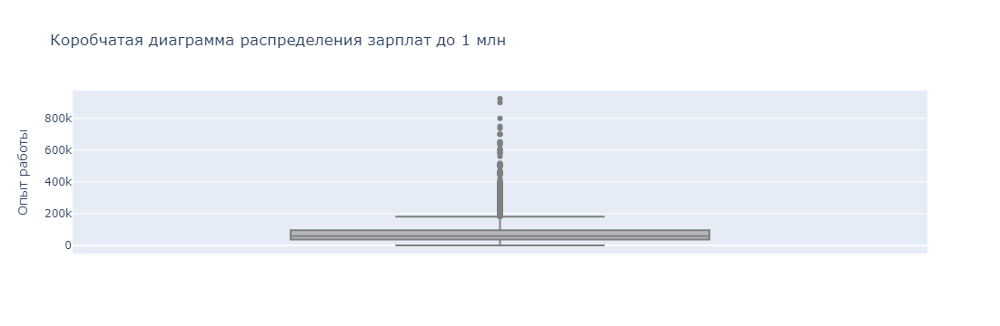

24304876.0
0    50000.0
Name: ЗП (руб), dtype: float64


In [46]:
# Фильтр по ЗП < 1000000
ZP1_df = hh_database_df[(hh_database_df['ЗП (руб)'] < 1000000)]
# Фильтр по ЗП > 1000000
ZP2_df = hh_database_df[(hh_database_df['ЗП (руб)'] > 1000000)]

#Построение гистограмм
#Гистограмма распределения зарплаты общая
fig_hist = px.histogram(hh_database_df, 
                        x='ЗП (руб)', 
                        title='Гистограмма распределения зарплаты общая', 
                        color_discrete_sequence=['grey'],
                        height=450,
                        width=1200)
fig_hist.update_layout(xaxis_title='Опыт работы', yaxis_title='Частота')
fig_hist.show()
fig_hist.write_html("plotly/5_ZP_total.html")

#Гистограмма распределения зарплаты до 1 млн
fig_hist = px.histogram(ZP1_df, x='ЗП (руб)', 
                        title='Гистограмма распределения зарплаты до 1 млн', 
                        color_discrete_sequence=['grey'], 
                        nbins=20,
                        height=450,
                        width=1200)
fig_hist.update_layout(xaxis_title='Опыт работы', yaxis_title='Частота')
fig_hist.show()
fig_hist.write_html("plotly/6_ZP_less1.html")

#Гистограмма распределения зарплаты от 1 млн
fig_hist = px.histogram(ZP2_df, x='ЗП (руб)', 
                        title='Гистограмма распределения зарплаты от 1 млн', 
                        color_discrete_sequence=['grey'], 
                        nbins=20,
                        height=450,
                        width=1200) 
fig_hist.update_layout(xaxis_title='Опыт работы', yaxis_title='Частота')
fig_hist.show()
fig_hist.write_html("plotly/7_ZP_more1.html")

# Построение коробчатой диаграммы до 1 млн
fig_box = px.box(ZP1_df, y='ЗП (руб)', title='Коробчатая диаграмма распределения зарплат до 1 млн',
                 color_discrete_sequence=['grey'])
fig_box.update_layout(yaxis_title='Опыт работы')
fig_box.show()
fig_box.write_html("plotly/8_ZP_boxmore1.html")

# Вычисления по заданию
print(hh_database_df['ЗП (руб)'].max())
print(hh_database_df['ЗП (руб)'].mode())

Чтобы достать данные о соискателях с ЗП больше 1 млн руб именно из диаграммы, пришлось делать отдельную диаграмму.
Таких соискателей 5, и это аномалии в зарплате.
Предельные значения признака - от 1 тыс. руб. до 180 тыс. руб., ожидания большинства соискателей находится в примерных границах от 37 тыс. руб. до 95 тыс. руб.  (1 и 3 квартили)? 
Аномалии для признака возраста - от 180 тыс. руб.

4. Постройте диаграмму, которая показывает зависимость **медианной** желаемой заработной платы (**"ЗП (руб)"**) от уровня образования (**"Образование"**). Используйте для диаграммы данные о резюме, где желаемая заработная плата меньше 1 млн рублей.
*Сделайте выводы по представленной диаграмме: для каких уровней образования наблюдаются наибольшие и наименьшие уровни желаемой заработной платы? Как вы считаете, важен ли признак уровня образования при прогнозировании заработной платы?*

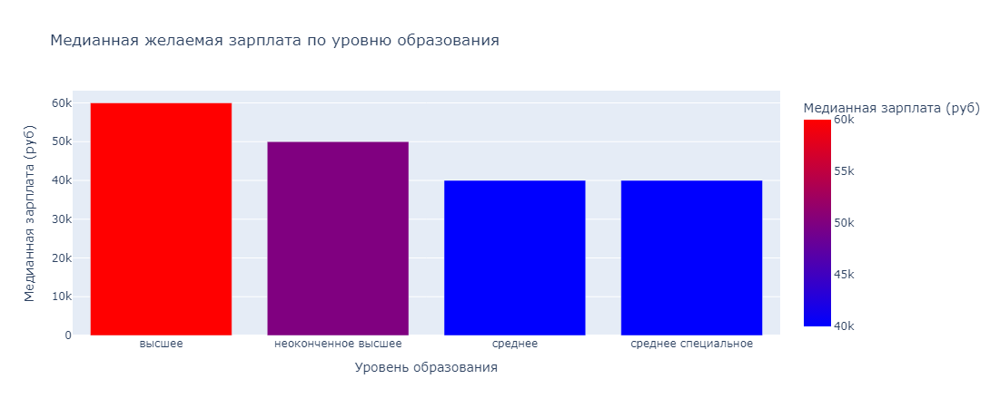

In [48]:
# Группировка данных для расчета медианной зарплаты
median_salary_education = ZP1_df.groupby('Образование')['ЗП (руб)'].median().reset_index()

fig = px.bar(median_salary_education, 
             x='Образование', 
             y='ЗП (руб)', 
             title='Медианная желаемая зарплата по уровню образования',
             labels={'ЗП (руб)': 'Медианная зарплата (руб)', 'Образование': 'Уровень образования'},
             color='ЗП (руб)', 
             color_continuous_scale=[(0, 'blue'), (1, 'red')],
             height=450,
             width=1200)
fig.write_html("plotly/9_median_salary_education.html")

fig.show()


Уровень образования - важен для прогноза зарплат. Разница медианных зарплат между категориями (среднее и среднее спеуиальное) и категорией Высшее составила 50%. Необходимо рассмотреть диапазон, но даже для медианы - это большая разница.

5. Постройте диаграмму, которая показывает распределение желаемой заработной платы (**"ЗП (руб)"**) в зависимости от города (**"Город"**). Используйте для диаграммы данные о резюме, где желая заработная плата меньше 1 млн рублей.
*Сделайте выводы по полученной диаграмме: как соотносятся медианные уровни желаемой заработной платы и их размах в городах? Как вы считаете, важен ли признак города при прогнозировании заработной платы?*

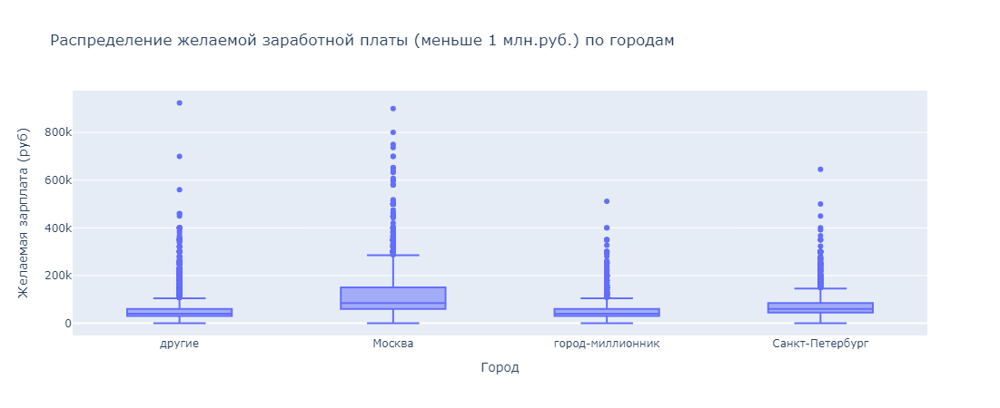

In [50]:
# Построение коробочной диаграммы для зарплат менее 1 млн.
fig = px.box(ZP1_df, 
             x='Город', y='ЗП (руб)', 
             title='Распределение желаемой заработной платы (меньше 1 млн.руб.) по городам',
             labels={'ЗП (руб)': 'Желаемая зарплата (руб)', 'Город': 'Город'},
             height=450,
             width=1200)
fig.write_html("plotly/10_ZP1.html")

fig.show()

Медианные уровни желаемой заработной платы и их размах в Москве и Санкт_петербурге значительнопревышают остальные города РФ.
Признак города важен - по крайней мере необходимо выделть 2 столицы.

6. Постройте **многоуровневую столбчатую диаграмму**, которая показывает зависимость медианной заработной платы (**"ЗП (руб)"**) от признаков **"Готовность к переезду"** и **"Готовность к командировкам"**. Проанализируйте график, сравнив уровень заработной платы в категориях.

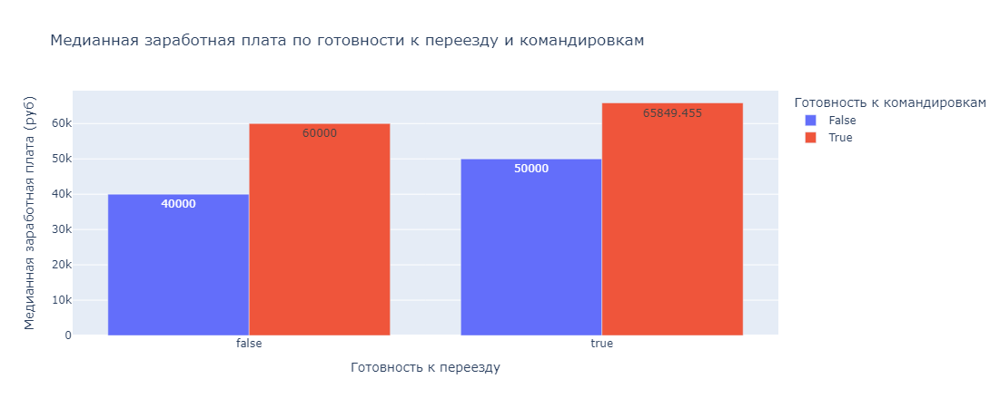

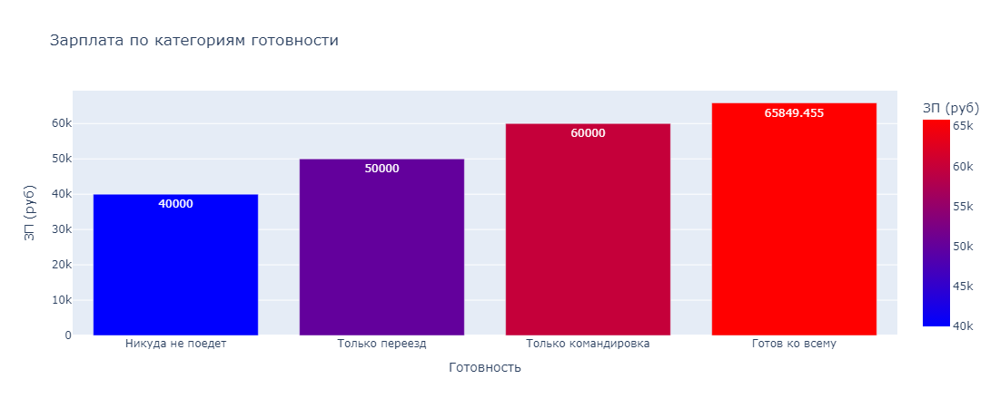

In [53]:
# Группировка данных для расчета медианной зарплаты
median_salary_worktravel = hh_database_df.groupby(['Готовность к переезду', 'Готовность к командировкам'])['ЗП (руб)'].median().reset_index()

# Построение многоуровневую  столбчатой диаграммы
fig = px.bar(median_salary_worktravel, 
             x='Готовность к переезду', 
             y='ЗП (руб)', 
             color='Готовность к командировкам',
             barmode='group',
             title='Медианная заработная плата по готовности к переезду и командировкам',
             labels={'ЗП (руб)': 'Медианная заработная плата (руб)', 'Готовность к переезду': 'Готовность к переезду'},
             text='ЗП (руб)',
             height=450,
             width=1200)
fig.write_html("plotly/11_median_salary_worktravel.html")

# Отображение диаграммы
fig.show()

# Создадим новый датафрейм со столбцом "Готовность"
# Функция для готовности
def determine_readiness(row):
    if row['Готовность к переезду'] and row['Готовность к командировкам']:
        return 'Готов ко всему'
    elif row['Готовность к переезду']:
        return 'Только переезд'
    elif row['Готовность к командировкам']:
        return 'Только командировка'
    else:
        return 'Никуда не поедет'

# Применяем функцию к каждой строке DataFrame
hh_database_df['Готовность'] = hh_database_df.apply(determine_readiness, axis=1)

# Группируем данные по готовности и вычисляем медианную зарплату
worktravel_df = hh_database_df.groupby(['Готовность'])['ЗП (руб)'].median().reset_index()
worktravel_df = worktravel_df.sort_values(by='ЗП (руб)', ascending=True)


fig = px.bar(worktravel_df, x='Готовность', y='ЗП (руб)',
             title='Зарплата по категориям готовности',
             labels={'Готовность': 'Готовность', 'ЗП (руб)': 'ЗП (руб)'},
             color='ЗП (руб)', text='ЗП (руб)',
             color_continuous_scale=[(0, 'blue'), (1, 'red')],
             height=450,
             width=1200)

fig.show()
fig.write_html("plotly/12_worktravel_df.html")

Многоуровневая диаграмма не совсем подходит, можно свести все к одному показателю и построить столбчатую диаграмму.
В любом случае, данные позволяют сказать что Готовность к командировкам оценивается выше готовности к переезду.
Соискатели готовые и к переезду и к командировке оценивают желаемую ЗП на 65% больше чем те кто ни готов ни к чему.

7. Постройте сводную таблицу, иллюстрирующую зависимость **медианной** желаемой заработной платы от возраста (**"Возраст"**) и образования (**"Образование"**). На полученной сводной таблице постройте **тепловую карту**. Проанализируйте тепловую карту, сравнив показатели внутри групп.

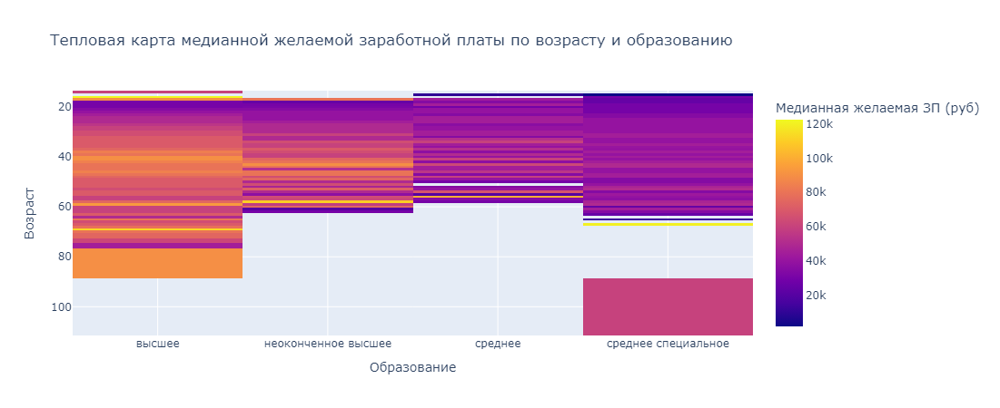

In [52]:
# Создание сводной таблицы
pivot_table = hh_database_df.pivot_table(values='ЗП (руб)', 
                                       index='Возраст', columns='Образование', aggfunc='median')

# Построение тепловой карты
fig = px.imshow(pivot_table, labels=dict(x="Образование", y="Возраст", color="Медианная желаемая ЗП (руб)"),
                x=pivot_table.columns,
                y=pivot_table.index,
                title="Тепловая карта медианной желаемой заработной платы по возрасту и образованию",
                height=450,
                width=1200)

fig.show()
fig.write_html("plotly/13_salary_heatmap.html")

1. Не совсем ясен уровень образования Высшее у соискателей младше 20 лет. ТАм и всплеск медианной зарплаты до 120 тыс.
2. Соискатели со средним и средним-специальным образованием примерно одинаково оценивают желаемую зарплату.
3. У Категрии Высшее явный скачок по ожидпним по сравнению с остальными категориями.

8. Постройте **диаграмму рассеяния**, показывающую зависимость опыта работы (**"Опыт работы (месяц)"**) от возраста (**"Возраст"**). Опыт работы переведите из месяцев в года, чтобы признаки были в едином масштабе. Постройте на графике дополнительно прямую, проходящую через точки (0, 0) и (100, 100). Данная прямая соответствует значениям, когда опыт работы равен возрасту человека. Точки, лежащие на этой прямой и выше нее - аномалии в наших данных (опыт работы больше либо равен возрасту соискателя)

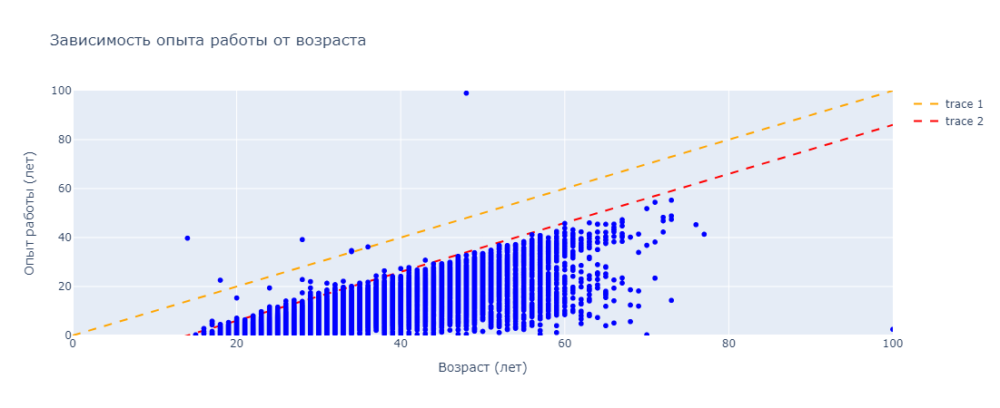

In [56]:
# Перевод опыта работы в годы
hh_database_df['Опыт работы (год)'] = hh_database_df['Опыт работы (месяц)'] / 12

# Создание диаграммы рассеяния
fig = px.scatter(hh_database_df, x='Возраст', y='Опыт работы (год)',
                 title='Зависимость опыта работы от возраста',
                 labels={'Возраст': 'Возраст (лет)', 'Опыт работы (год)': 'Опыт работы (лет)'},
                 color_discrete_sequence=['blue'],
                 height=450,
                 width=1200) 
fig.write_html("plotly/14_rasseivanie.html")

# Добавление прямой y=x
x = np.linspace(0, 100, 100)  
fig.add_scatter(x=x, y=x, mode='lines', line=dict(color='orange', dash='dash'))

# Добавление прямой y=x-14
x = np.linspace(0, 100, 100)  
fig.add_scatter(x=x, y=x-14, mode='lines', line=dict(color='red', dash='dash'))

# Настройка осей
fig.update_layout(
    xaxis=dict(range=[0, 100], title='Возраст (лет)'),
    yaxis=dict(range=[0, 100], title='Опыт работы (лет)'),
    showlegend=True
)

fig.show()


Оранжевая линия показывает явный обман соискателей - когда опыт больше возраста.
Думаю, здесь можно было отсечь линией от 14 лет (красная линия), с точки зрения complaence.

**Дополнительные баллы**

Для получения 2 дополнительных баллов по разведывательному анализу постройте еще два любых содержательных графика или диаграммы, которые помогут проиллюстрировать влияние признаков/взаимосвязь между признаками/распределения признаков. Приведите выводы по ним. Желательно, чтобы в анализе участвовали признаки, которые мы создавали ранее в разделе "Преобразование данных".


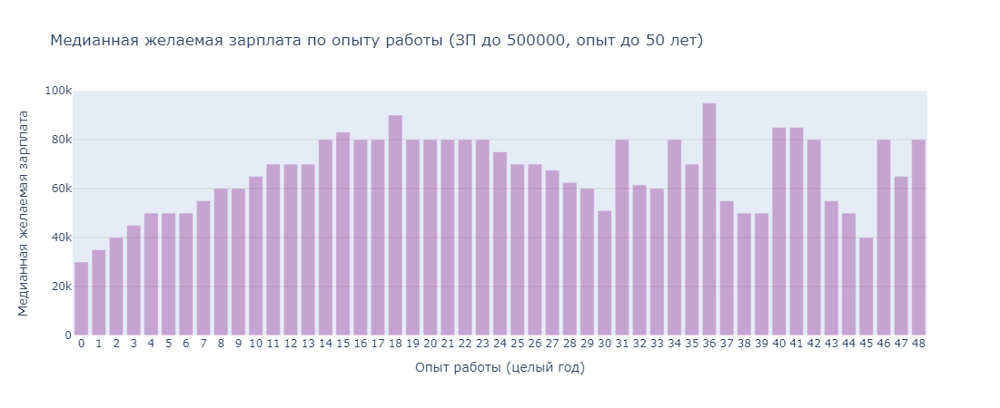

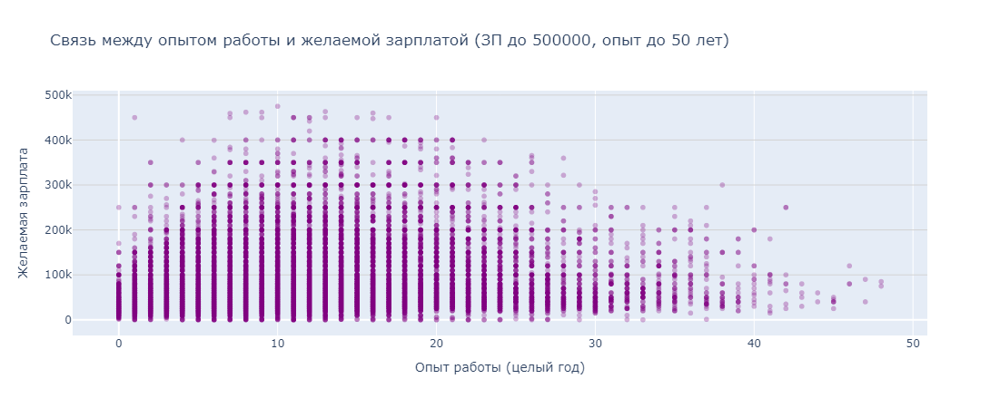

In [58]:
# Находим целые года опыта работы
hh_database_df['Опыт работы (целый год)'] = hh_database_df['Опыт работы (месяц)'] // 12

# Фильтр по ЗП < 500000 и опыту меньше 50 лет
ZP3_df = hh_database_df[(hh_database_df['ЗП (руб)'] < 500000) & (hh_database_df['Опыт работы (целый год)'] < 50)]

# Группировка данных для расчета медианной зарплаты
median_salary_opit = ZP3_df.groupby(['Опыт работы (целый год)'])['ЗП (руб)'].median().reset_index()

# Построение диаграммы зависимости желаемой медианной зарплаты от опыта работы (ЗП до 500000, опыт до 50 лет)
# Создание столбчатой диаграммы
fig = px.bar(median_salary_opit, 
              x='Опыт работы (целый год)', 
              y='ЗП (руб)', 
              title='Медианная желаемая зарплата по опыту работы (ЗП до 500000, опыт до 50 лет)',
              labels={'Опыт работы (целый год)': 'Опыт работы (целый год)', 'ЗП (руб)': 'Медианная желаемая зарплата'},
              color_discrete_sequence=['purple'],
              opacity=0.3,
              height=450,
              width=1200)   
fig.update_layout(
    xaxis_title='Опыт работы (целый год)',
    yaxis_title='Медианная желаемая зарплата',
    xaxis=dict(tickmode='linear'),  
    yaxis=dict(showgrid=True, gridcolor='LightGray'),  
)
fig.show()
fig.write_html("plotly/15_median_salary_opit.html")

# Построение диаграммы рассеивания зарплаты от опыта работы (ЗП до 500000, опыт до 50 лет)
fig = px.scatter(ZP3_df, 
                 x='Опыт работы (целый год)', 
                 y='ЗП (руб)', 
                 title='Связь между опытом работы и желаемой зарплатой (ЗП до 500000, опыт до 50 лет)',
                 labels={'Опыт работы (целый год)': 'Опыт работы (целый год)', 'ЗП (руб)': 'Желаемая зарплата'},
                 color_discrete_sequence=['purple'],  
                 opacity=0.3,
                 height=450,
                 width=1200)

fig.update_layout(
    xaxis_title='Опыт работы (целый год)',
    yaxis_title='Желаемая зарплата',
    yaxis=dict(showgrid=True, gridcolor='LightGray'),  
)

fig.show()
fig.write_html("plotly/16_median_salary_rasseiv.html")


# Удаляем ненужные столбцы после анализа
hh_database_df.drop(columns=['Опыт работы (целый год)'], inplace=True)

Начиная с опыта работы 10 лет и до 30 лет выдерживается стабильно выше 60 т.р. медианная сумма желаемой зарплаты.

# Очистка данных

1. Начнем с дубликатов в наших данных. Найдите **полные дубликаты** в таблице с резюме и удалите их. 

In [66]:
# Поиск дубликатов
duplicates = hh_database_df[hh_database_df.duplicated()]

print(duplicates.shape)

(158, 25)


In [67]:
# Удаление дубликатов
hh_database_df.drop_duplicates(inplace=True)

2. Займемся пропусками. Выведите информацию **о числе пропусков** в столбцах. 

In [69]:
missing_values = hh_database_df.isnull().sum()

# Вывод информации о пропусках
print("Количество пропусков в каждом столбце:")
print(missing_values)

Количество пропусков в каждом столбце:
Ищет работу на должность:            0
Последнее/нынешнее место работы      1
Последняя/нынешняя должность         2
Обновление резюме                    0
Авто                                 0
Образование                          0
Пол                                  0
Возраст                              0
Опыт работы (месяц)                168
Город                                0
Готовность к переезду                0
Готовность к командировкам           0
полная занятость                     0
частичная занятость                  0
проектная работа                     0
волонтерство                         0
стажировка                           0
полный день                          0
сменный график                       0
гибкий график                        0
удаленная работа                     0
вахтовый метод                       0
ЗП (руб)                             0
Готовность                           0
Опыт работы (год)        

3. Итак, у нас есть пропуски в 3ех столбцах: **"Опыт работы (месяц)"**, **"Последнее/нынешнее место работы"**, **"Последняя/нынешняя должность"**. Поступим следующим образом: удалите строки, где есть пропуск в столбцах с местом работы и должностью. Пропуски в столбце с опытом работы заполните **медианным** значением.

In [71]:
# Удаляем строки с пропусками в столбцах "Последнее/нынешнее место работы" и "Последняя/нынешняя должность"
hh_database_df = hh_database_df.dropna(subset=["Последнее/нынешнее место работы", "Последняя/нынешняя должность"])



# Заполняем пропуски в столбце "Опыт работы (месяц)" медианным значением
median_experience = hh_database_df["Опыт работы (месяц)"].median()
hh_database_df["Опыт работы (месяц)"] = hh_database_df["Опыт работы (месяц)"].fillna(median_experience)

print(round(hh_database_df["Опыт работы (месяц)"].mean()))

print("Количество пропусков после обработки:")
print(hh_database_df.isnull().sum())


114
Количество пропусков после обработки:
Ищет работу на должность:            0
Последнее/нынешнее место работы      0
Последняя/нынешняя должность         0
Обновление резюме                    0
Авто                                 0
Образование                          0
Пол                                  0
Возраст                              0
Опыт работы (месяц)                  0
Город                                0
Готовность к переезду                0
Готовность к командировкам           0
полная занятость                     0
частичная занятость                  0
проектная работа                     0
волонтерство                         0
стажировка                           0
полный день                          0
сменный график                       0
гибкий график                        0
удаленная работа                     0
вахтовый метод                       0
ЗП (руб)                             0
Готовность                           0
Опыт работы (год)     

4. Мы добрались до ликвидации выбросов. Сначала очистим данные вручную. Удалите резюме, в которых указана заработная плата либо выше 1 млн. рублей, либо ниже 1 тыс. рублей.

In [73]:
# Находим количество выбросов при очистке с заработной платой выше 1 млн рублей или ниже 1 тыс. рублей
garbage_df = hh_database_df[(hh_database_df["ЗП (руб)"] > 1000000) | (hh_database_df["ЗП (руб)"] < 1000)]
print(garbage_df.shape[0])


89


In [74]:
# Удаляем резюме с заработной платой выше 1 млн рублей или ниже 1 тыс. рублей
# Получаем индексы строк, которые нужно удалить
indexes_to_drop = hh_database_df[(hh_database_df["ЗП (руб)"] > 1000000) | (hh_database_df["ЗП (руб)"] < 1000)].index

print(indexes_to_drop)

# Удаляем строки
hh_database_df = hh_database_df.drop(indexes_to_drop)

print(hh_database_df.shape[0])

Index([  253,   514,   552,  1087,  2248,  3431,  3927,  4622,  4903,  5005,
        5100,  5953,  6526,  6931,  6991,  7987,  8476,  8517,  9278,  9605,
       10376, 11229, 12149, 12395, 12802, 13499, 13906, 13993, 15102, 15257,
       15493, 15679, 15690, 15757, 15818, 16210, 16521, 17954, 18419, 18707,
       18898, 20964, 21056, 21150, 21313, 21837, 22509, 24222, 25244, 26080,
       27070, 27232, 27254, 27984, 28253, 28353, 29382, 29961, 30283, 30435,
       31736, 32212, 32265, 32988, 33415, 33942, 34058, 35016, 35352, 36466,
       36672, 36701, 37625, 37802, 38314, 39015, 39191, 39338, 39576, 39636,
       40652, 40799, 41742, 41924, 42329, 42841, 43134, 43385, 44107],
      dtype='int64')
44495


5. В процессе разведывательного анализа мы обнаружили резюме, в которых **опыт работы в годах превышал возраст соискателя**. Найдите такие резюме и удалите их из данных


In [76]:
# Найти резюме, где опыт работы превышает возраст
invalid_resumes = hh_database_df[hh_database_df["Опыт работы (год)"] >= hh_database_df["Возраст"]]

# Шаг 3: Подсчитать количество таких резюме
number_of_invalid_resumes = invalid_resumes.shape[0]

# Вывести количество таких резюме
print(number_of_invalid_resumes)

# Получаем индексы строк, где опыт работы меньше или равен возрасту
indexes_to_drop = hh_database_df[hh_database_df["Опыт работы (год)"] >= hh_database_df["Возраст"]].index

# Удаляем строки
hh_database_df = hh_database_df.drop(indexes_to_drop)

# Вывести количество оставшихся резюме
print(hh_database_df.shape[0])

7
44488


6. В результате анализа мы обнаружили потенциальные выбросы в признаке **"Возраст"**. Это оказались резюме людей чересчур преклонного возраста для поиска работы. Попробуйте построить распределение признака в **логарифмическом масштабе**. Добавьте к графику линии, отображающие **среднее и границы интервала метода трех сигм**. Напомним, сделать это можно с помощью метода axvline. Например, для построение линии среднего будет иметь вид:

`histplot.axvline(log_age.mean(), color='k', lw=2)`

В какую сторону асимметрично логарифмическое распределение? Напишите об этом в комментарии к графику.
Найдите выбросы с помощью метода z-отклонения и удалите их из данных, используйте логарифмический масштаб. Давайте сделаем послабление на **1 сигму** (возьмите 4 сигмы) в **правую сторону**.

Выведите таблицу с полученными выбросами и оцените, с каким возрастом соискатели попадают под категорию выбросов?

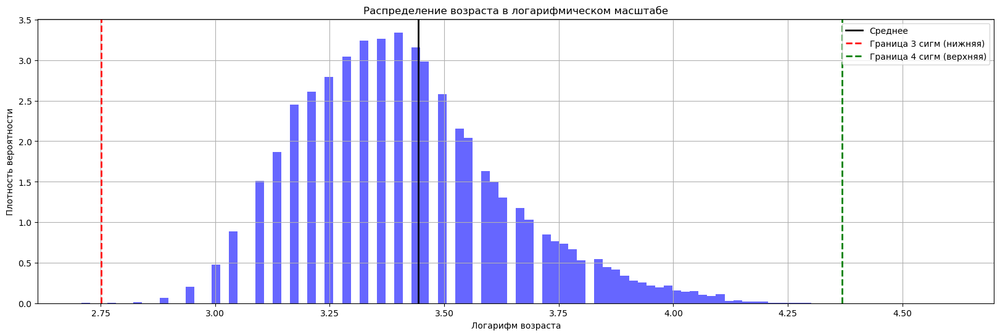

Выбросы по возрасту:
       Возраст  log_age
31137       15  2.70805
32950       15  2.70805
33654      100  4.60517


In [129]:
# Логарифм возраста
hh_database_df['log_age'] = np.log(hh_database_df['Возраст'])

# Вычисление среднего и стандартного отклонения
mean_log_age = hh_database_df['log_age'].mean()
std_log_age = hh_database_df['log_age'].std()

# Границы интервала метода трёх сигм (по заданию справа - 4 сигмы)
lower_bound = mean_log_age - 3 * std_log_age
upper_bound = mean_log_age + 4 * std_log_age

#  Создание гистограммы
plt.figure(figsize=(20, 6))
plt.hist(hh_database_df['log_age'], bins=100, density=True, alpha=0.6, color='blue')

# Добавление линий для среднего и границ
plt.axvline(mean_log_age, color='black', linestyle='solid', linewidth=2, label='Среднее')
plt.axvline(lower_bound, color='red', linestyle='dashed', linewidth=2, label='Граница 3 сигм (нижняя)')
plt.axvline(upper_bound, color='green', linestyle='dashed', linewidth=2, label='Граница 4 сигм (верхняя)')

# Настройка графика
plt.title('Распределение возраста в логарифмическом масштабе')
plt.xlabel('Логарифм возраста')
plt.ylabel('Плотность вероятности')
plt.legend()
plt.grid()

plt.show()


# Найти выбросы с помощью метода z-отклонения
z_scores = (hh_database_df['log_age'] - mean_log_age) / std_log_age
outliers = hh_database_df[(z_scores < -3) | (z_scores > 4)]  # Используем 4 сигмы

# Удалить выбросы из данных
hh_database_df = hh_database_df[(z_scores < 4) & (z_scores > -3)]

# Таблица с выбросами
print("Выбросы по возрасту:")
print(outliers[['Возраст', 'log_age']])


Всего 3 выброса по возрасту.
Думаю, сто если бы не было чисток до последней - этих выбросов было бы больше.
И послаблений не надо было делать, 3 сигмы справа - тоже хороший результат.